In [60]:
import numpy as np
import pandas as pd

pd.options.display.max_columns = None
pd.options.display.max_rows = None

import seaborn as sns
from matplotlib import pyplot as plt
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from PIL import Image

In [61]:
df = pd.read_csv("../data/2023-24_reg_season_clean.csv")

# convert to date type
df["game_time"] = pd.to_datetime(df["game_time"])
df["date"] = pd.to_datetime(df["date"])

# mark the week of season
df['week_number'] = df['date'].dt.isocalendar().week
df['week_of_season'] = np.where(df['week_number'] >= 43, df['week_number'] - 42, df['week_number'] + 1 +(df['week_number'].max() - df['week_number'][0]))

df['team_game_id'] = df.groupby('abbreviation').cumcount() + 1

# mark games before and after the TBD tournament games
after_cup_dict = df[df['date'].gt("2023-12-02")].groupby('abbreviation').first()['team_game_id'].to_dict()
# after_cup_dict

df['after_id'] = df['abbreviation'].map(after_cup_dict)
df['is_first_after_cup'] = np.where(df['team_game_id'] == df['after_id'], 1, 0)
df['distance_from_previous_game'] = np.where(df['is_first_after_cup'] == 1, 0, df['distance_from_previous_game'])

# print(df_2022.shape)
print(df.shape)
df.head(2)

(2400, 75)


,team,opponent,day_of_week,date,Start (ET),season_start_year,is_playoff,is_home_game,game_time,city_team_key,abbreviation,timezone,time_diff_from_et,elevation,Latitude,Longitude,city_team_key_opponent,abbreviation_opponent,timezone_opponent,time_diff_from_et_opponent,elevation_opponent,Latitude_opponent,Longitude_opponent,is_covid_bubble,is_pre_nba_cup_knockout,is_post_nba_cup,game_time_diff_from_et,game_lat,game_lon,game_elevation,home_team_abbr,away_team_abbr,game_id,time_since_prev_game,is_last_game_home,is_2_games_ago_home,is_3_games_ago_home,is_4_games_ago_home,is_5_games_ago_home,is_6_games_ago_home,is_7_games_ago_home,num_away_last_5_games,start_of_streak,streak_id,streak_counter,incoming_away_game_streak,days_since_1_games_ago,days_since_2_games_ago,days_since_3_games_ago,days_since_4_games_ago,days_since_5_games_ago,days_since_6_games_ago,days_since_7_games_ago,num_games_last_4_days,num_games_last_7_days,prev_game_lon,prev_game_lat,distance_from_previous_game,cumulative_distance,is_back_to_back,team_opponent,abbreviation_opponent.1,time_since_prev_game_opponent,num_games_last_7_days_opponent,distance_from_previous_game_opponent,cumulative_distance_opponent,hours_of_rest_difference,games_last_7_diff,prev_game_distance_diff,cumulative_distance_diff,week_number,week_of_season,team_game_id,after_id,is_first_after_cup
0,Atlanta Hawks,Charlotte Hornets,Wed,2023-10-25,7:00p,2023,0,0,2023-10-25 19:00:00,Atlanta Hawks,ATL,America/New_York,0,1023,33.757,84.396,Charlotte Hornets,CHA,America/New_York,0,721,35.225,80.839,0,1,0,0,35.225,80.839,721,CHA,ATL,ATL@CHA_2023-10-25,-1.0,1,1,1,1,1,1,1,0,True,1,1,0,150.0,150.0,150.0,150.0,150.0,150.0,150.0,0,0,84.396,33.757,226.016193,226.016193,0,Charlotte Hornets,CHA,-1.0,0,0.000000,0.000000,0.0,0,226.016193,226.016193,43,1,1,20,0
1,Atlanta Hawks,New York Knicks,Fri,2023-10-27,7:30p,2023,0,1,2023-10-27 19:30:00,Atlanta Hawks,ATL,America/New_York,0,1023,33.757,84.396,New York Knicks,NYK,America/New_York,0,35,40.751,73.993,0,1,0,0,33.757,84.396,1023,ATL,NYK,NYK@ATL_2023-10-27,48.5,0,1,1,1,1,1,1,1,True,2,1,0,2.0,150.0,150.0,150.0,150.0,150.0,150.0,1,1,80.839,35.225,226.016193,452.032386,0,New York Knicks,NYK,48.5,1,746.273513,746.273513,0.0,0,-520.257320,-294.241127,43,1,2,20,0


In [72]:
df['week_of_season'].max()

25

In [66]:
# total travel for each team (simple)

# week = 1


chart_data = df

chart_piv = chart_data.pivot_table(
    index=[
        "season_start_year",
        "abbreviation",
        "team",
        "week_of_season",
    ],
    values=[
        "distance_from_previous_game",
        "date",
    ],
    aggfunc={
        "distance_from_previous_game": [
            "sum",
            "count",
        ],
        "date": [
            "min",
            "max",
        ],
    },
)

chart_piv.columns = ["_".join(col[::-1]).strip() for col in chart_piv.columns.values]

chart_piv = chart_piv.reset_index()
# chart_piv.columns = ["_".join(col).strip() for col in chart_piv.columns.values]

chart_piv["team"] = chart_piv["team"].str.split(" ").str[-1]
chart_piv = (
    chart_piv.sort_values(by=["sum_distance_from_previous_game", "team"])
).reset_index(drop=True)

print(chart_piv.shape)
chart_piv.head()

(720, 8)


,season_start_year,abbreviation,team,week_of_season,max_date,min_date,count_distance_from_previous_game,sum_distance_from_previous_game
0,2023,PHI,76ers,2,2023-11-04,2023-11-02,2,0.0
1,2023,PHI,76ers,18,2024-02-25,2024-02-22,3,0.0
2,2023,POR,Blazers,17,2024-02-15,2024-02-13,2,0.0
3,2023,POR,Blazers,18,2024-02-25,2024-02-23,2,0.0
4,2023,MIL,Bucks,1,2023-10-29,2023-10-26,2,0.0


1 (30, 9)


/var/folders/dq/n1gz5xz55cj7qv8f04fcsb0m0000gp/T/ipykernel_6226/3250399547.py:85: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_yticklabels(['{:,.0f}'.format(x) for x in current_values])


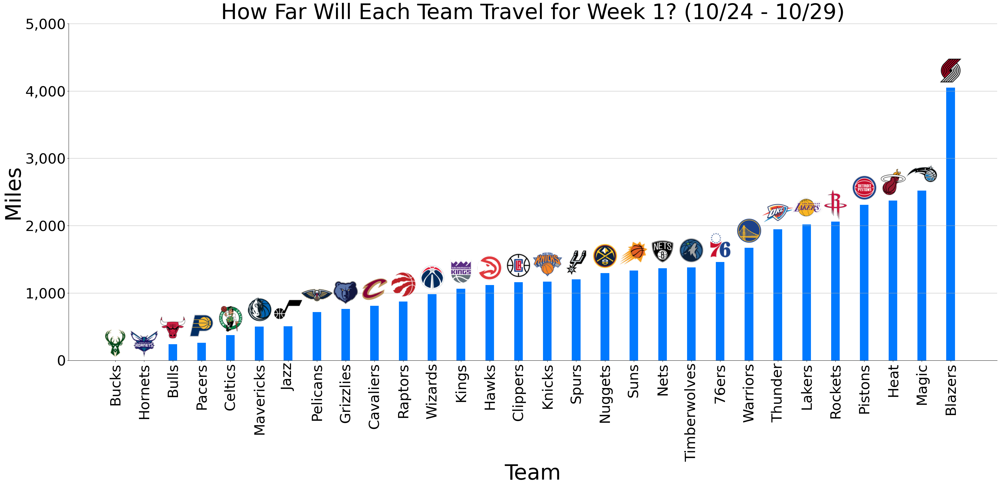

2 (30, 9)


/var/folders/dq/n1gz5xz55cj7qv8f04fcsb0m0000gp/T/ipykernel_6226/3250399547.py:85: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_yticklabels(['{:,.0f}'.format(x) for x in current_values])


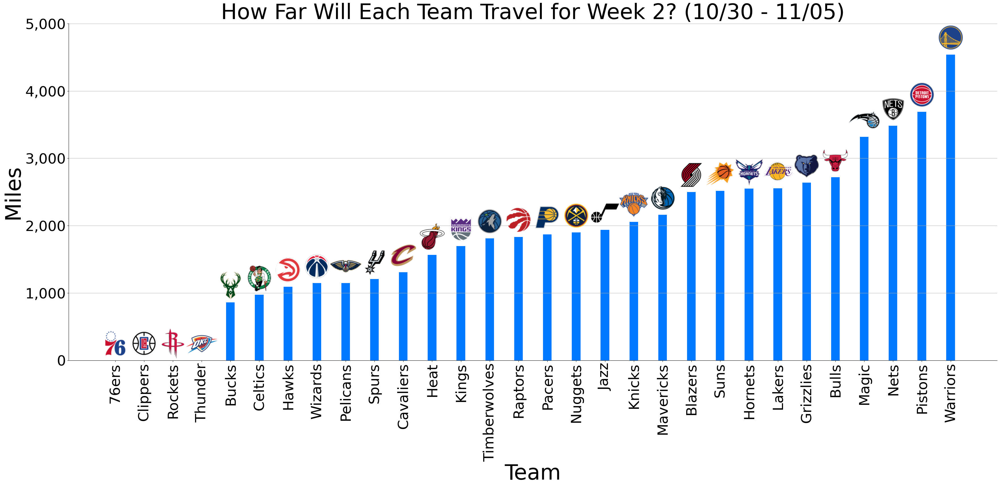

3 (30, 9)


/var/folders/dq/n1gz5xz55cj7qv8f04fcsb0m0000gp/T/ipykernel_6226/3250399547.py:85: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_yticklabels(['{:,.0f}'.format(x) for x in current_values])


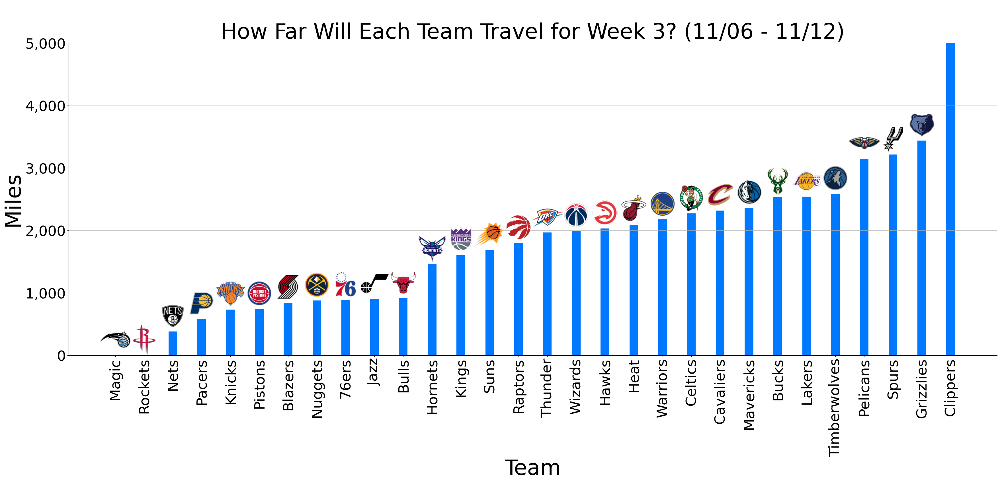

4 (30, 9)


/var/folders/dq/n1gz5xz55cj7qv8f04fcsb0m0000gp/T/ipykernel_6226/3250399547.py:85: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_yticklabels(['{:,.0f}'.format(x) for x in current_values])


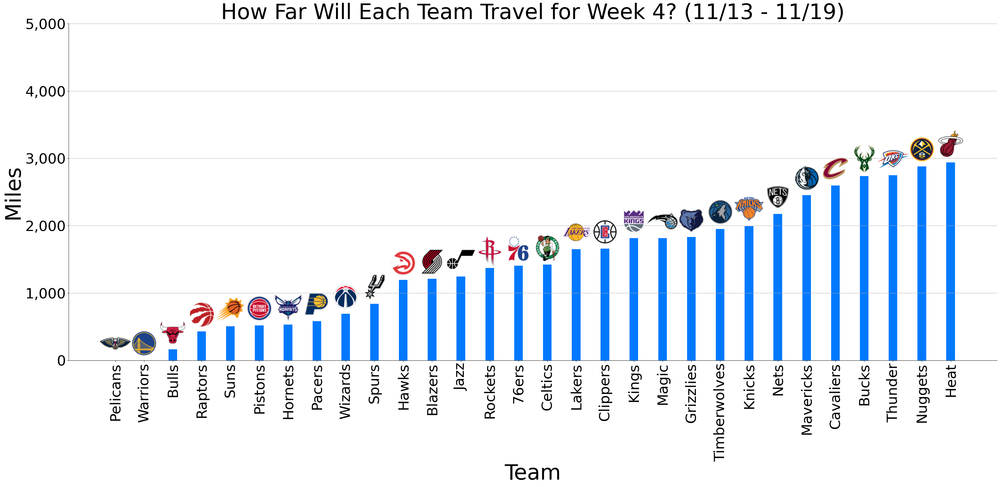

5 (30, 9)


/var/folders/dq/n1gz5xz55cj7qv8f04fcsb0m0000gp/T/ipykernel_6226/3250399547.py:85: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_yticklabels(['{:,.0f}'.format(x) for x in current_values])


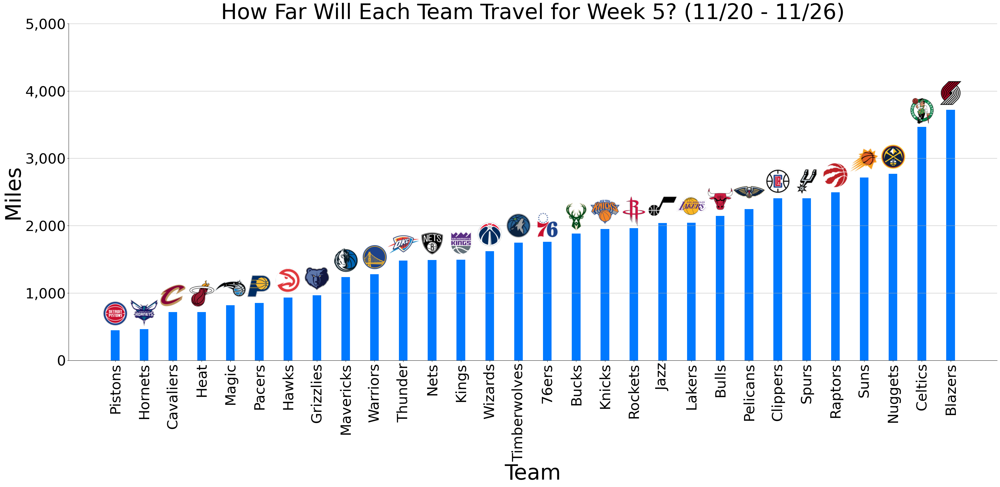

6 (30, 9)


/var/folders/dq/n1gz5xz55cj7qv8f04fcsb0m0000gp/T/ipykernel_6226/3250399547.py:85: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_yticklabels(['{:,.0f}'.format(x) for x in current_values])


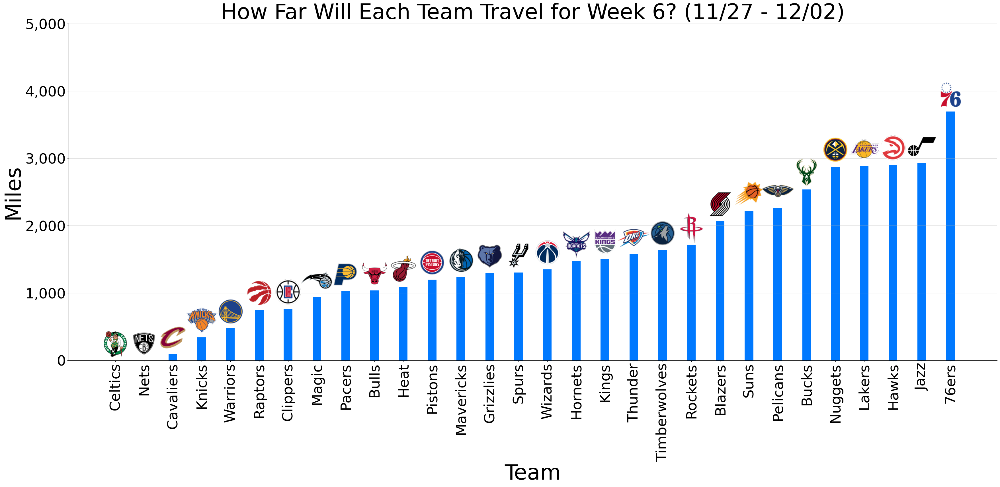

7 (0, 9)
8 (30, 9)


/var/folders/dq/n1gz5xz55cj7qv8f04fcsb0m0000gp/T/ipykernel_6226/3250399547.py:85: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_yticklabels(['{:,.0f}'.format(x) for x in current_values])


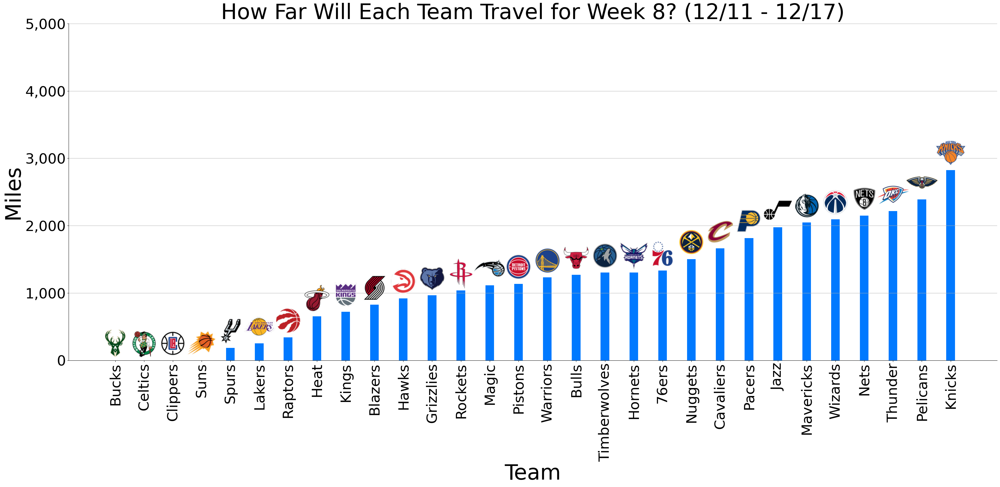

9 (30, 9)


/var/folders/dq/n1gz5xz55cj7qv8f04fcsb0m0000gp/T/ipykernel_6226/3250399547.py:85: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_yticklabels(['{:,.0f}'.format(x) for x in current_values])


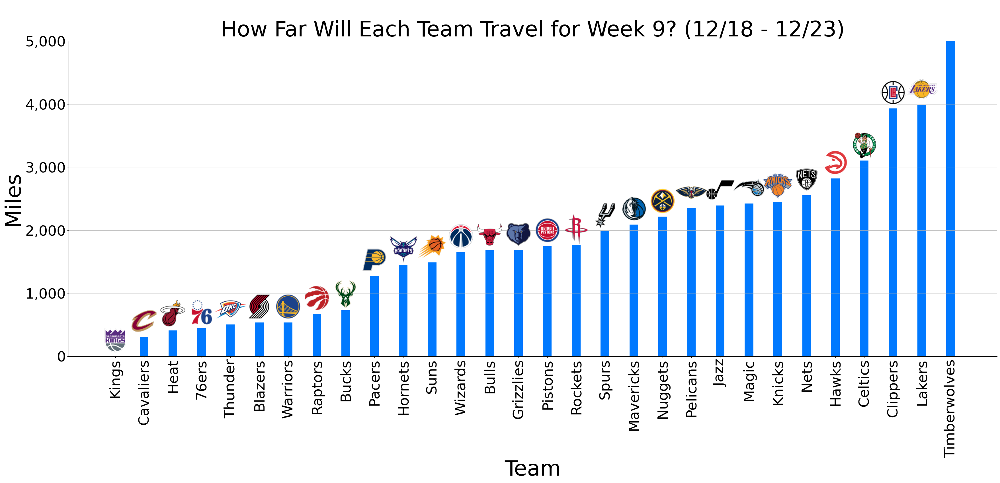

10 (30, 9)


/var/folders/dq/n1gz5xz55cj7qv8f04fcsb0m0000gp/T/ipykernel_6226/3250399547.py:85: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_yticklabels(['{:,.0f}'.format(x) for x in current_values])


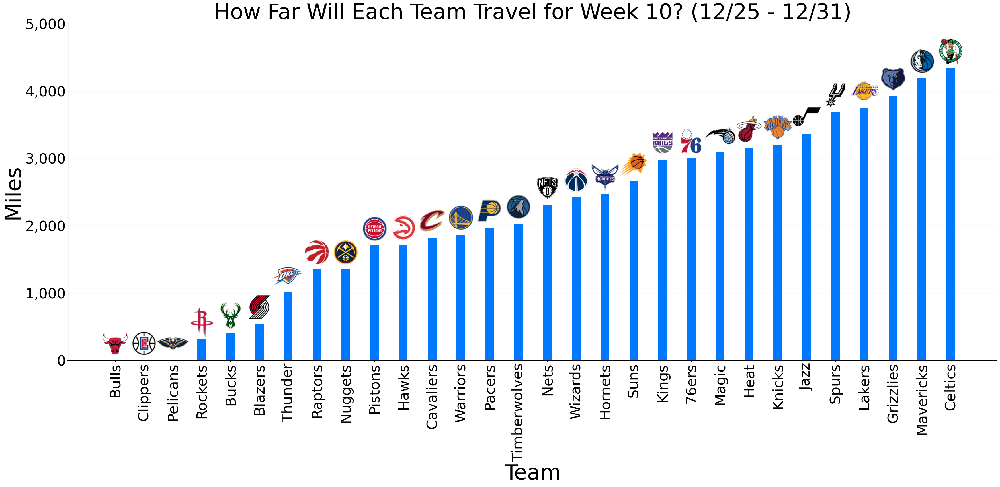

11 (30, 9)


/var/folders/dq/n1gz5xz55cj7qv8f04fcsb0m0000gp/T/ipykernel_6226/3250399547.py:85: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_yticklabels(['{:,.0f}'.format(x) for x in current_values])


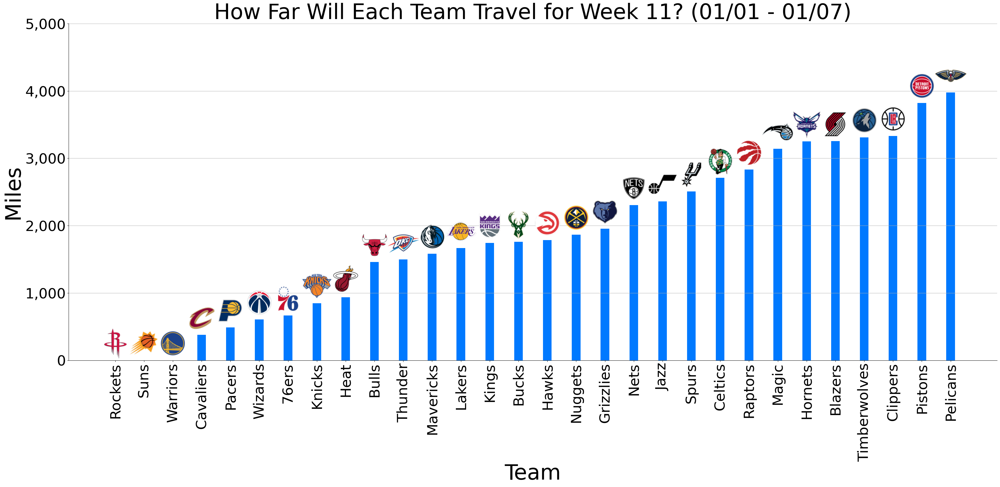

12 (30, 9)


/var/folders/dq/n1gz5xz55cj7qv8f04fcsb0m0000gp/T/ipykernel_6226/3250399547.py:85: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_yticklabels(['{:,.0f}'.format(x) for x in current_values])


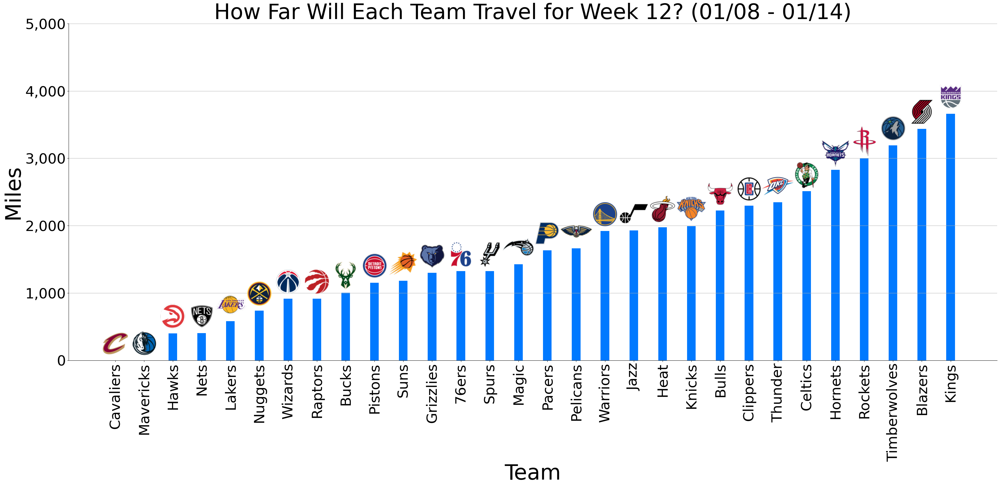

13 (30, 9)


/var/folders/dq/n1gz5xz55cj7qv8f04fcsb0m0000gp/T/ipykernel_6226/3250399547.py:85: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_yticklabels(['{:,.0f}'.format(x) for x in current_values])


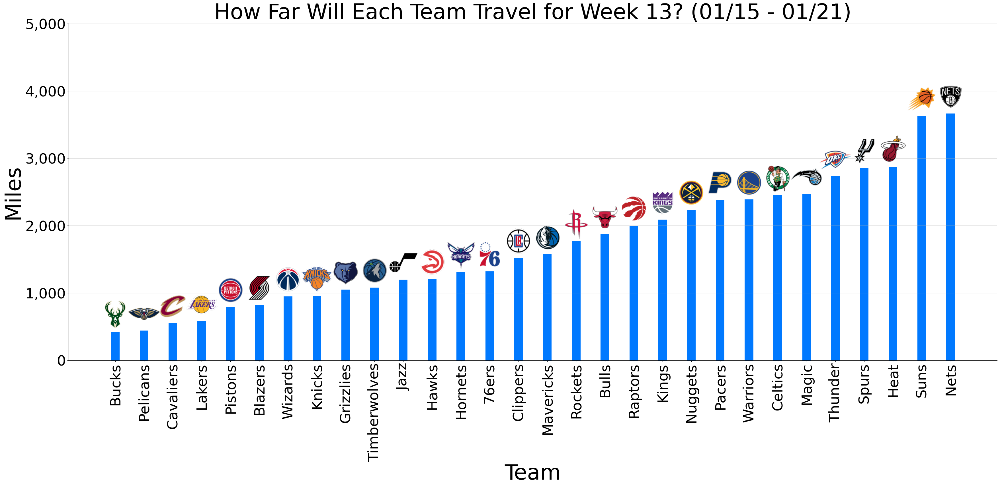

14 (30, 9)


/var/folders/dq/n1gz5xz55cj7qv8f04fcsb0m0000gp/T/ipykernel_6226/3250399547.py:85: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_yticklabels(['{:,.0f}'.format(x) for x in current_values])


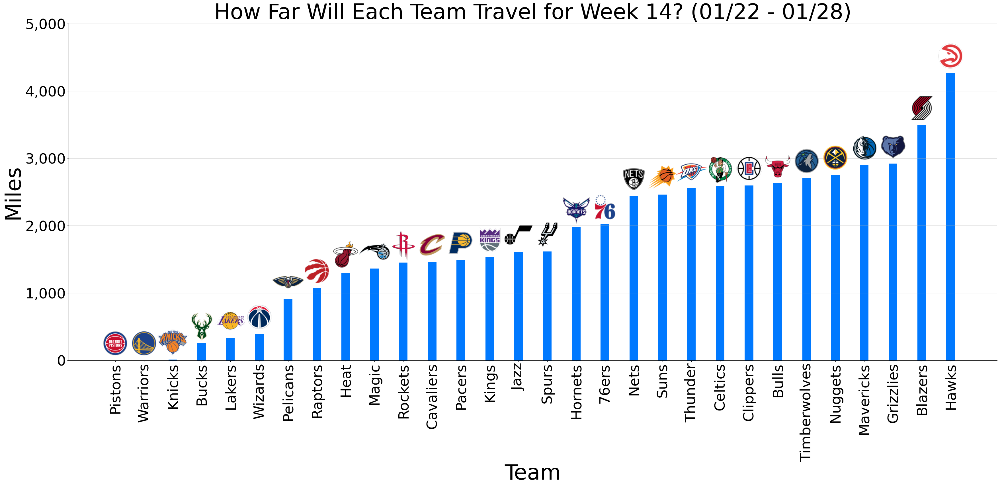

15 (30, 9)


/var/folders/dq/n1gz5xz55cj7qv8f04fcsb0m0000gp/T/ipykernel_6226/3250399547.py:85: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_yticklabels(['{:,.0f}'.format(x) for x in current_values])


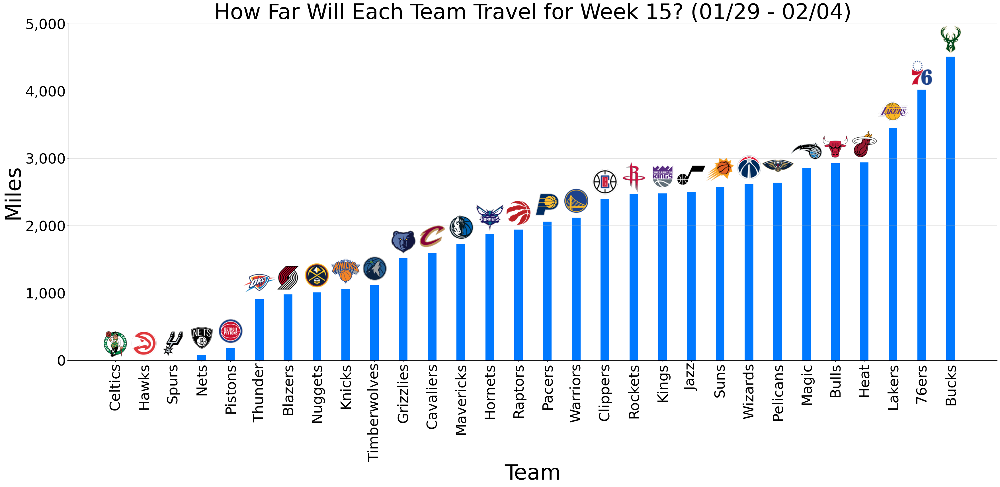

16 (30, 9)


/var/folders/dq/n1gz5xz55cj7qv8f04fcsb0m0000gp/T/ipykernel_6226/3250399547.py:85: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_yticklabels(['{:,.0f}'.format(x) for x in current_values])


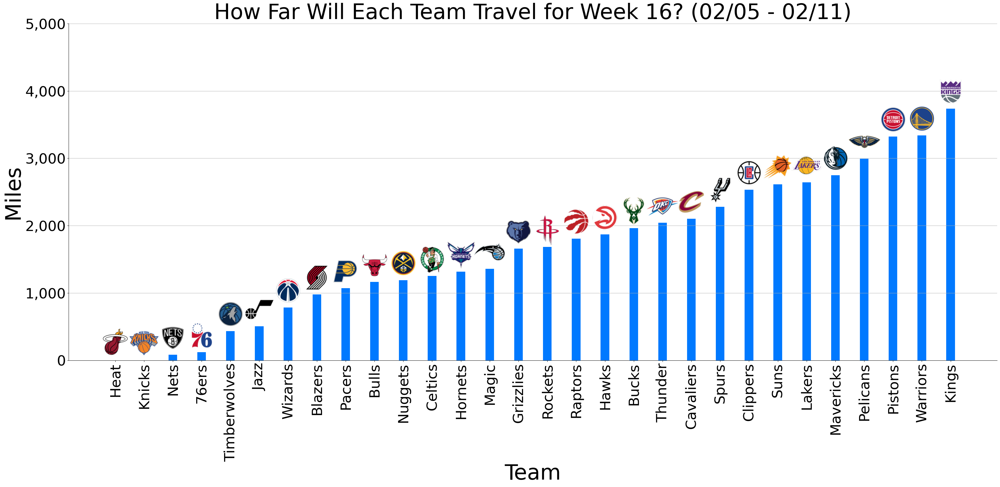

17 (30, 9)


/var/folders/dq/n1gz5xz55cj7qv8f04fcsb0m0000gp/T/ipykernel_6226/3250399547.py:85: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_yticklabels(['{:,.0f}'.format(x) for x in current_values])


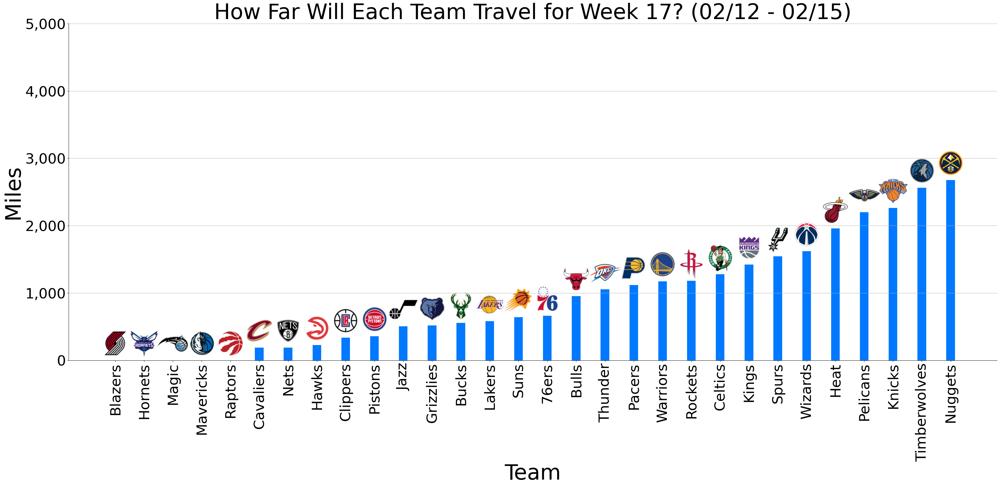

18 (30, 9)


/var/folders/dq/n1gz5xz55cj7qv8f04fcsb0m0000gp/T/ipykernel_6226/3250399547.py:85: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_yticklabels(['{:,.0f}'.format(x) for x in current_values])


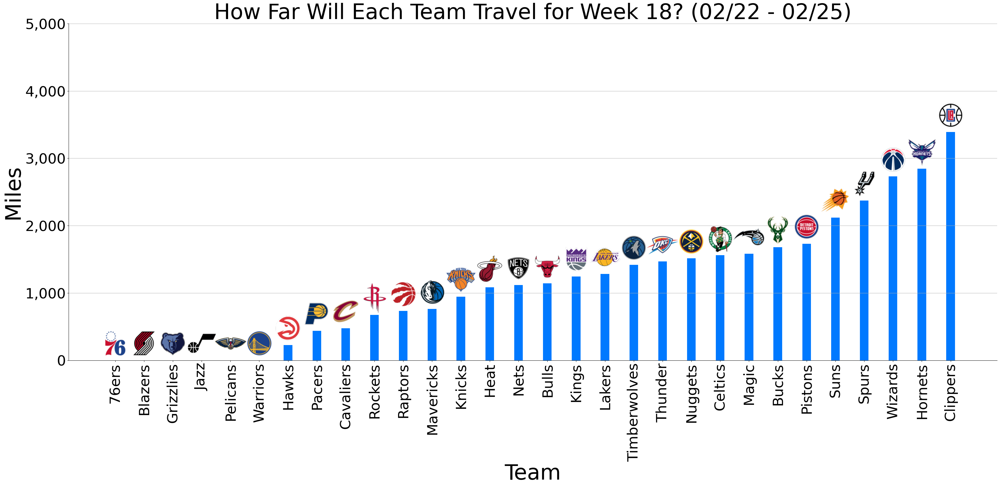

19 (30, 9)


/var/folders/dq/n1gz5xz55cj7qv8f04fcsb0m0000gp/T/ipykernel_6226/3250399547.py:85: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_yticklabels(['{:,.0f}'.format(x) for x in current_values])


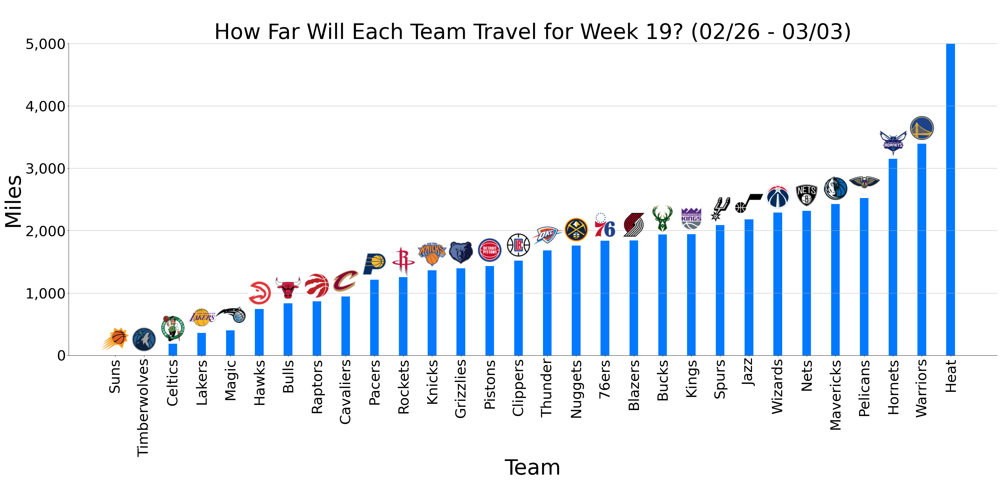

20 (30, 9)


/var/folders/dq/n1gz5xz55cj7qv8f04fcsb0m0000gp/T/ipykernel_6226/3250399547.py:85: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_yticklabels(['{:,.0f}'.format(x) for x in current_values])


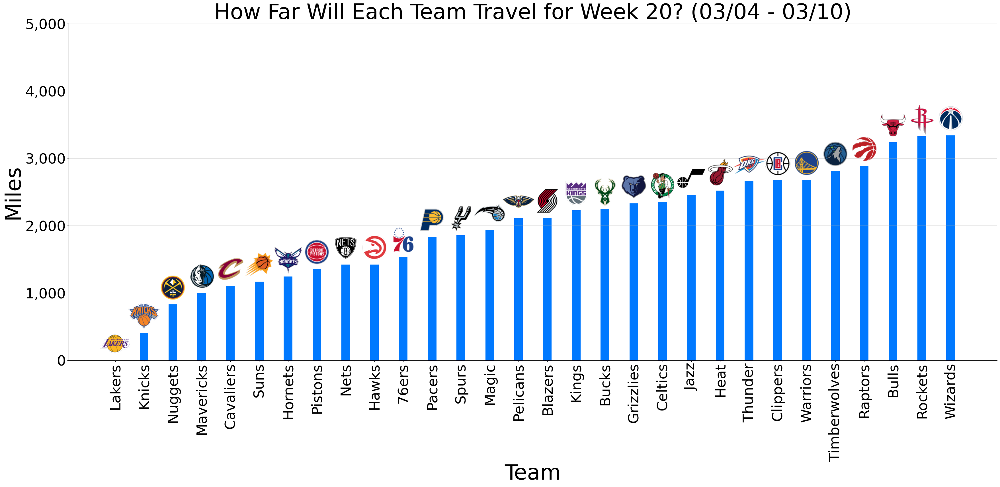

21 (30, 9)


/var/folders/dq/n1gz5xz55cj7qv8f04fcsb0m0000gp/T/ipykernel_6226/3250399547.py:85: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_yticklabels(['{:,.0f}'.format(x) for x in current_values])


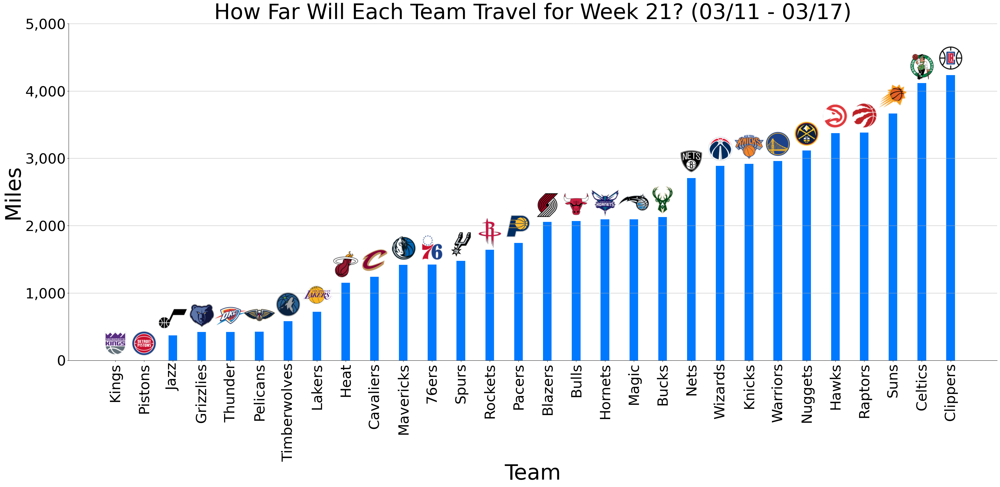

22 (30, 9)


/var/folders/dq/n1gz5xz55cj7qv8f04fcsb0m0000gp/T/ipykernel_6226/3250399547.py:85: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_yticklabels(['{:,.0f}'.format(x) for x in current_values])


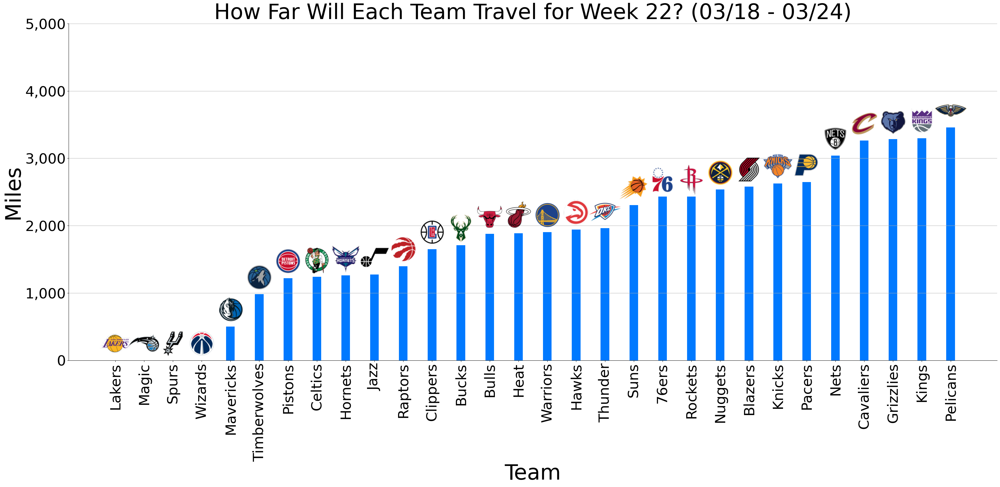

23 (30, 9)


/var/folders/dq/n1gz5xz55cj7qv8f04fcsb0m0000gp/T/ipykernel_6226/3250399547.py:85: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_yticklabels(['{:,.0f}'.format(x) for x in current_values])


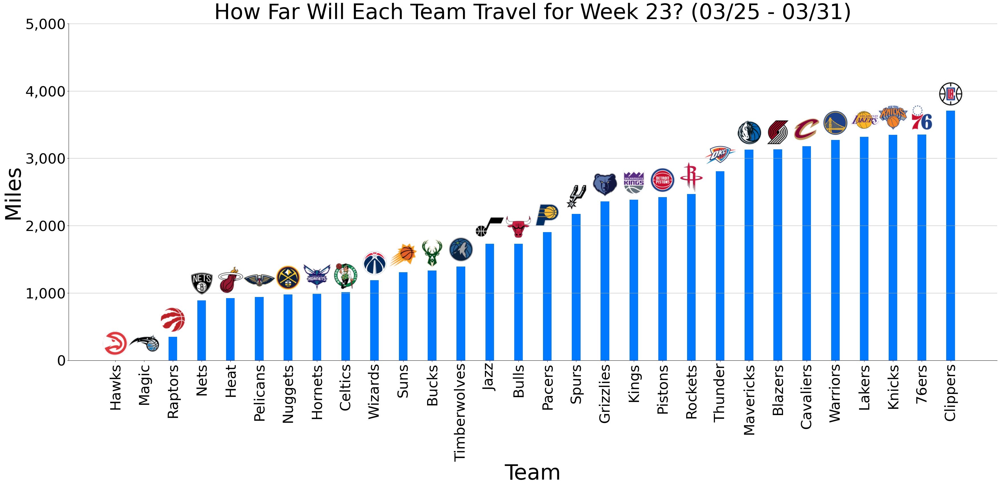

24 (30, 9)


/var/folders/dq/n1gz5xz55cj7qv8f04fcsb0m0000gp/T/ipykernel_6226/3250399547.py:85: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_yticklabels(['{:,.0f}'.format(x) for x in current_values])


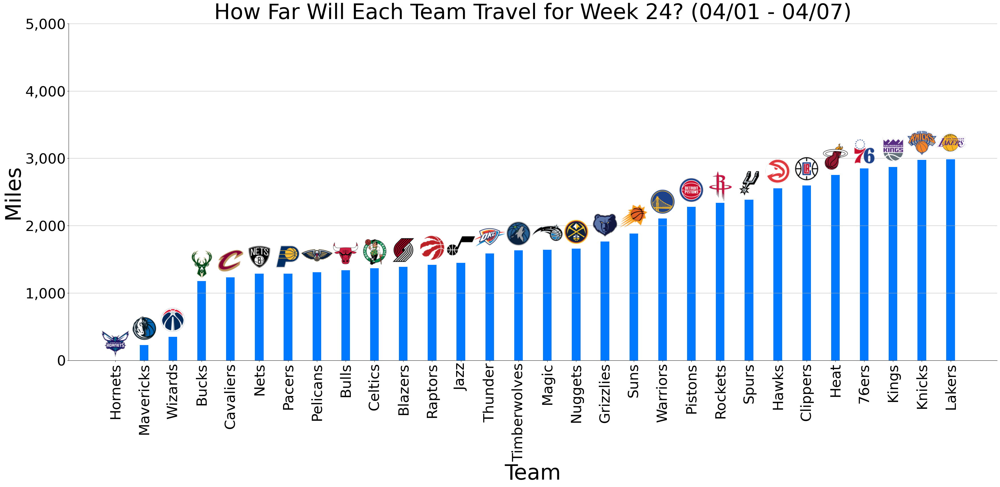

25 (30, 9)


/var/folders/dq/n1gz5xz55cj7qv8f04fcsb0m0000gp/T/ipykernel_6226/3250399547.py:85: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_yticklabels(['{:,.0f}'.format(x) for x in current_values])


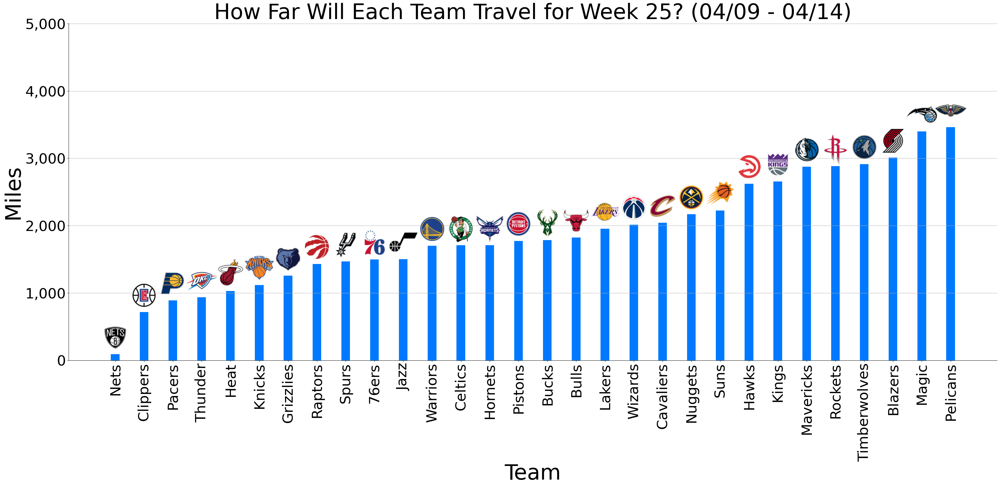

In [71]:
for week in range(1,chart_piv['week_of_season'].max() + 1):
    temp = chart_piv[chart_piv['week_of_season'] == week].reset_index().copy()
    print(week, temp.shape)
    if week == 7:
        continue
    # make chart
    SMALL_SIZE = 12 * 3
    MEDIUM_SIZE = 18 * 3
    LARGE_SIZE = 24 * 3

    plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
    plt.rc('axes', titlesize=SMALL_SIZE)     # fontsize of the axes title
    plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
    plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
    plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
    plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize
    plt.rc('figure', titlesize=LARGE_SIZE)  # fontsize of the figure title



    # Define the figure and axes
    fig, ax = plt.subplots(figsize=(36, 18))
    # fig, ax = plt.subplots()

    # # Create the bar chart
    bars = ax.bar(
        temp["team"],
        temp["sum_distance_from_previous_game"],
        width=0.3,
        color="#0079FF", 
        label="Miles Traveled"
    )


    # Function to load and display PNG images above the bars
    def add_image_above_bar(image_path, ax, bar, offset_x=0, offset_y=250):
        img = Image.open(image_path)
        # img = img.convert("RGBA")  # Convert to RGBA format to handle transparency
        # img = img.resize((30, 30))  # Adjust the image size as needed
        img = img.resize((80, 80))  # Adjust the image size as needed
        # img = img.resize((40, 40))  # Adjust the image size as needed

        imagebox = OffsetImage(img, zoom=1)
        ab = AnnotationBbox(
            imagebox,
            (bar.get_x() + bar.get_width() / 2 + offset_x, bar.get_height() + offset_y),
            frameon=False,
        )
        ax.add_artist(ab)


    # Load and display PNG images above the bars
    for index, row in temp.iterrows():
        # print(index, row['abbreviation'])
        image_path = f"../assets/_nba_png/{row['abbreviation'].lower()}.png"
        add_image_above_bar(image_path, ax, bars[index])

    # Define the format for the month and day
    date_format = "%m/%d"

    # Extract the month and day from 'min_date' and 'max_date'
    min_date_formatted = temp['min_date'].min().strftime(date_format)
    max_date_formatted = temp['max_date'].max().strftime(date_format)
    # week = temp['week_of_season'].max()

    # Create the title with formatted dates
    plt.title(f"How Far Will Each Team Travel for Week {week}? ({min_date_formatted} - {max_date_formatted})", fontsize=MEDIUM_SIZE)

    # plt.title(f"How Far Will Each Team Travel between {chart_piv['min_date'].min()} - {chart_piv['max_date'].max()}?", fontsize=MEDIUM_SIZE)


    # Customize the chart
    ax.set_xlabel("Team")
    # ax.set_xlabel("")
    ax.set_ylabel("Miles")
    ax.grid(axis="y")


    # Rotate the x-axis labels for better readability
    plt.xticks(rotation=90)#, ha="right")
    plt.ylim(0, 5_000)

    # after plotting the data, format the labels
    current_values = plt.gca().get_yticks()
    plt.gca().set_yticklabels(['{:,.0f}'.format(x) for x in current_values])

    sns.despine()
    plt.tight_layout()
    plt.savefig(f"../assets/_generated_images/league_travel_week_{week}.png")
    plt.show()


In [64]:
assert False

AssertionError: 

In [ ]:
# piv = df_2022.pivot_table(
#     index=["season_start_year","abbreviation", "team"],
#     values="distance_from_previous_game",
#     aggfunc="sum"
    
# ).sort_values(by="distance_from_previous_game").reset_index()
# piv['team'] = piv['team'].str.split(" ").str[-1]
# print(piv.shape)


# # Define the figure and axes
# fig, ax = plt.subplots(figsize=(12, 6))

# # # Create the bar chart
# bars = ax.bar(
#     piv["team"],
#     piv["distance_from_previous_game"],
#     width=0.3,
#     # color="gray", 
#     # edgecolor="black",
# )

# # Load and display PNG images above the bars
# for index, row in piv.iterrows():
#     # print(index, row['abbreviation'])
#     image_path = f"../assets/_nba_png/{row['abbreviation'].lower()}.png"
#     add_image_above_bar(image_path, ax, bars[index])

# # Customize the chart
# ax.set_xlabel("Team")
# ax.set_ylabel("Miles")
# # ax.set_title()
# ax.grid(axis="y")


# # Rotate the x-axis labels for better readability
# plt.xticks(rotation=90)#, ha="right")
# # plt.title("Distance traveled by each team for the 2023 Season", fontsize=MEDIUM_SIZE)
# # plt.title("Distance traveled by each team for the 2023 Season", fontsize=MEDIUM_SIZE)
# plt.title("How far did each team travel for the 2022 season?", fontsize=MEDIUM_SIZE)

# # Show the plot
# plt.tight_layout()
# plt.ylim(0, 60_000)
# sns.despine()
# # plt.savefig("")
# plt.show()
# print(piv['season_start_year'].unique())


In [ ]:
# accounting for the tournament
temp = df.copy()

# temp = temp[
#     (temp['abbreviation'] == "ATL")
#     & (temp['date'] >= "2023-11-28")
#     & (temp['date'] <= "2023-12-18")
#     # (temp["is_post_nba_cup"] == 1)
# ]
# print(temp.shape)


# temp.head()

# temp['distance_from_previous_game2'] = temp['distance_from_previous_game']
# temp['distance_from_previous_game2'] = np.where(temp['date'] == "2023-12-11" & temp['is_home_game'],1 , 0)

In [ ]:
assert False

In [ ]:
# travel by week for each team

travel_by_week = df.pivot_table(
    index=["abbreviation", 'week_of_season'],
    values=['distance_from_previous_game'],
    aggfunc=sum
).reset_index()

travel_by_week['smooth'] = travel_by_week["distance_from_previous_game"].rolling(5).mean()

temp = travel_by_week[travel_by_week['abbreviation'].isin(travel_by_week['abbreviation'].unique().tolist()[:4])]

plt.figure(figsize=(10,4))
sns.lineplot(x="week_of_season", y="distance_from_previous_game", data=temp, hue="abbreviation", markers='o')
plt.grid()

plt.figure(figsize=(10,4))
sns.lineplot(x="week_of_season", y="smooth", data=temp, hue="abbreviation", markers='o')
plt.grid()


In [ ]:
# rest by week
# travel by week for each team

vars = ["time_since_prev_game"]
temp = df.pivot_table(
    index=["abbreviation", 'week_of_season'],
    values=vars,
    aggfunc="sum"
).reset_index()

temp['smooth'] = temp[vars[0]].rolling(5).mean()

temp = temp[temp['abbreviation'].isin(temp['abbreviation'].unique().tolist()[:4])]

plt.figure(figsize=(10,4))
sns.lineplot(x="week_of_season", y=vars[0], data=temp, hue="abbreviation", marker='o')
plt.grid()

plt.figure(figsize=(10,4))
sns.lineplot(x="week_of_season", y="smooth", data=temp, hue="abbreviation", marker='o')
plt.grid()


In [ ]:
# games per week
# rest by week
# travel by week for each team

vars = ["time_since_prev_game"]
temp = df.pivot_table(
    index=["abbreviation", 'week_of_season'],
    values=vars,
    aggfunc="count"
).reset_index()

temp['smooth'] = temp[vars[0]].rolling(5).mean()

temp = temp[temp['abbreviation'].isin(temp['abbreviation'].unique().tolist()[:4])]

plt.figure(figsize=(10,4))
sns.lineplot(x="week_of_season", y=vars[0], data=temp, hue="abbreviation", marker='o')
plt.grid()

plt.figure(figsize=(10,4))
sns.lineplot(x="week_of_season", y="smooth", data=temp, hue="abbreviation", marker='o')
plt.grid()


In [ ]:
# for the match ups in a coming week, compare the teams playing each other and the few games prior

In [ ]:
# jetlag (timezone changes) (hours lost vs hours gained)

# number of back-to-backs
#

In [ ]:
# # how many quick turn around games are there in 2023
# a = processed_df[
#     (processed_df["time_since_prev_game"] <= 24)
#     & (processed_df["season_start_year"].isin(list(range(2014, 2024))))
# ]

# a.pivot_table(
#     index=[
#         "season_start_year",
#         # "abbreviation",
#     ],
#     values=["game_id"],
#     aggfunc=["count"],
# )/2

In [ ]:
# number of 4 in 5 sets by season

# number of 5 in 7 sets by season

# number of back-to-backs by season

In [ ]:
plt.figure(figsize=(8,5))
# temp_df = df
temp_df = df[
    (df['team_abbreviation'] == "GSW")
    # & (df['season_start_year'] == 2018)
#     (df['cumulative_distance'] > 3000)
#     & (df['incoming_away_game_streak'] > 2)
]
sns.regplot(x = "cumulative_distance", y="point_difference", data=temp_df, line_kws={"color":"red"})
plt.grid()


In [ ]:
plt.figure(figsize=(8,5))


sns.countplot(x = "incoming_away_game_streak", hue="WL", data=temp_df)
plt.grid()


In [ ]:
temp_df = df[df['team_abbreviation'] == "ATL"]
print(temp_df.shape)
temp_df.head()